In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/archive_dataset.zip" -d "/content/dataset"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1449).jpeg  
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (145).jpeg  
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1450).jpeg  
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1451).jpeg  
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1452).jpeg  
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1453).jpeg  
  inflating: /content/dataset/Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1454).jpeg  
  inflating: /content/dataset/Landscape 

In [ ]:
import os
os.listdir('/content/dataset/Landscape Classification/Landscape Classification/Training Data')

['Desert', 'Glacier', 'Mountain', 'Coast', 'Forest']

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, models
from torch.utils.data import DataLoader, random_split
import os

In [ ]:
import torch
import torchvision.models as models

# Load VGG16 with pretrained weights

model = models.vgg16(pretrained=True)


In [ ]:
import torchvision.transforms as transforms

# Define transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224
    transforms.ToTensor(),  # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization
])


In [ ]:
from PIL import Image
import torch.nn as nn

# Remove last classification layer (FC layer) to extract features only
vgg16_features = nn.Sequential(*list(model.children())[:-1])

def extract_features(image_path):
    image = Image.open(image_path).convert('RGB')  # Load image
    image = transform(image).unsqueeze(0)  # Apply transformations and add batch dimension

    with torch.no_grad():  # No gradient required
        features = vgg16_features(image)

    return features.view(-1).numpy()  # Flatten the feature vector


In [ ]:
label, song = recommend_knn("/content/dataset/sample_test.jpg")
print(f"Predicted Label: {label}")
print(f"🎶 Recommended Song: {song}")


NameError: name 'recommend_knn' is not defined

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize to fit ResNet50
    transforms.ToTensor(),           # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize for ResNet
])

In [ ]:
dataset_path = "/content/dataset/Landscape Classification/Landscape Classification/Training Data"

dataset_val_path = "/content/dataset/Landscape Classification/Landscape Classification/Validation Data"

dataset = datasets.ImageFolder(root=dataset_path, transform=transform)

dataset_val = datasets.ImageFolder(root=dataset_val_path, transform=transform)

# Check class names
print(dataset.classes)
print(dataset_val.classes)

['Coast', 'Desert', 'Forest', 'Glacier', 'Mountain']
['Coast', 'Desert', 'Forest', 'Glacier', 'Mountain']


In [ ]:
train_size = len(dataset)
val_size = len(dataset_val)
#train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(dataset_val, batch_size=32, shuffle=False)

In [ ]:
#model = models.resnet50(pretrained=True)

# Modify the final fully connected layer for our number of classes
num_features = model.fc.in_features
num_classes = len(dataset.classes)  # Number of labels in your dataset
model.fc = torch.nn.Linear(num_features, num_classes)

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

AttributeError: 'VGG' object has no attribute 'fc'

In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn

# Load VGG16 with pretrained weights
model = models.vgg16(pretrained=True)

# Modify the final classification layer in the classifier
num_features = model.classifier[-1].in_features  # Get the input features of the last layer
num_classes = len(dataset.classes)  # Number of labels in your dataset

# Replace the last layer with a new Linear layer
model.classifier[-1] = nn.Linear(num_features, num_classes)

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


In [ ]:
num_epochs = 40

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")

Epoch 1/40, Loss: 0.4247613362134836
Epoch 2/40, Loss: 0.3987915562555051
Epoch 3/40, Loss: 0.4149020248994279
Epoch 4/40, Loss: 0.5689186033920739
Epoch 5/40, Loss: 0.393565879271815
Epoch 6/40, Loss: 0.33708822248747555
Epoch 7/40, Loss: 0.3039749925747847
Epoch 8/40, Loss: 0.31131989083969935
Epoch 9/40, Loss: 0.3145172388170855
Epoch 10/40, Loss: 0.2607054773051613
Epoch 11/40, Loss: 0.24594025133540645
Epoch 12/40, Loss: 0.2529855858974944
Epoch 13/40, Loss: 0.2222217207673354
Epoch 14/40, Loss: 0.23120831028103067
Epoch 15/40, Loss: 0.2819801424287807
Epoch 16/40, Loss: 0.2065101701099747
Epoch 17/40, Loss: 0.20759353664712593
Epoch 18/40, Loss: 0.2149943322309266
Epoch 19/40, Loss: 0.1865864595570884
Epoch 20/40, Loss: 0.16048111651723568


In [ ]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f'Validation Accuracy: {accuracy:.2f}%')


Validation Accuracy: 67.80%


In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/resnet50_model.pth")

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/resnet50_model.pth"))
model.eval()

<ipython-input-13-93aeeab2a4ef>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/content/drive/MyDrive/resnet50_model.pth"))


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

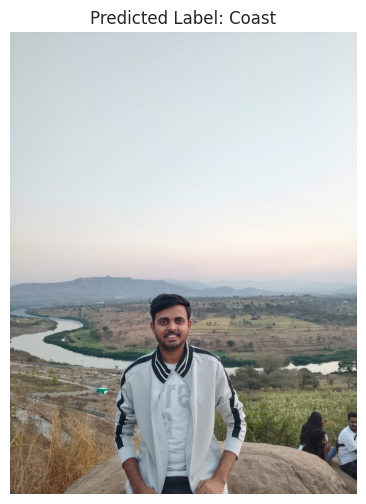

Coast


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load an image from local storage
image_path = "/content/drive/MyDrive/aman.jpg"  # Replace with your test image path
image = Image.open(image_path)

# Apply the same transformations used during training
image_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Convert the image
input_tensor = image_transform(image).unsqueeze(0)  # Add batch dimension

# Move to GPU if available
input_tensor = input_tensor.to(device)

# Predict the class
model.eval()
with torch.no_grad():
    output = model(input_tensor)
    predicted_class = torch.argmax(output).item()

# Get class labels
class_labels = dataset.classes
predicted_label = class_labels[predicted_class]

# Show result
plt.imshow(image)
plt.title(f"Predicted Label: {predicted_label}")
plt.axis("off")
plt.show()

print(predicted_label);

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/data.csv")
genre_data = pd.read_csv('/content/drive/MyDrive/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/data_by_year.csv')

In [ ]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


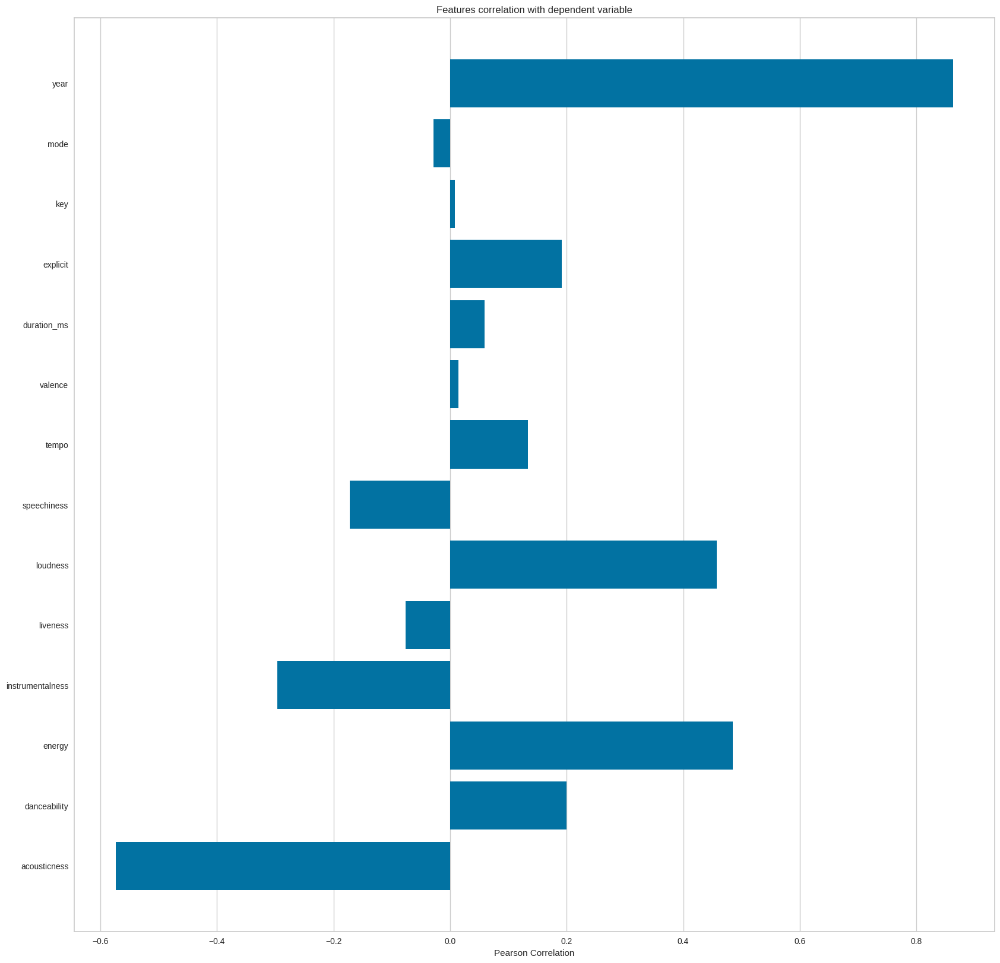

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

<Axes: xlabel='count', ylabel='decade'>

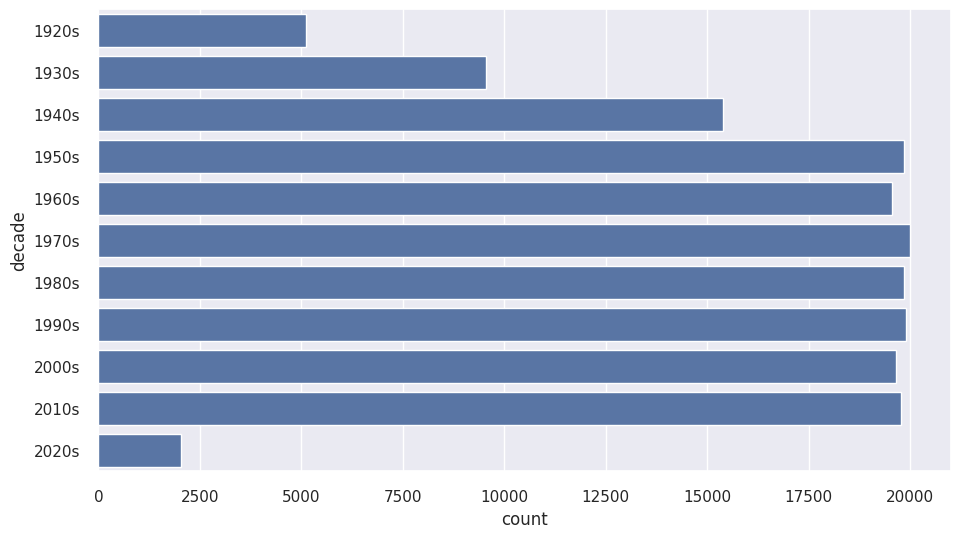

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.021s...
[t-SNE] Computed neighbors for 2973 samples in 1.054s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.102203
[t-SNE] KL divergence after 1000 iterations: 1.392052


In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [ ]:
!pip install spotipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.5/261.5 kB 17.7 MB/s eta 0:00:00


In [ ]:
!pip install spotipy
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import os


# Replace 'YOUR_CLIENT_ID' and 'YOUR_CLIENT_SECRET' with your actual Spotify API credentials

client_id = '8cd4598f52a34584b7577957a57b99af'
client_secret = '86614e0eccbf4d2bb6d51a472fb202d4'
# Check if the environment variables are set
if not client_id or not client_secret:
    raise ValueError("Spotify API credentials not found in environment variables. Please set SPOTIPY_CLIENT_ID and SPOTIPY_CLIENT_SECRET.")

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=client_id,
                                                           client_secret=client_secret))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']

    # Handle potential errors when fetching audio features
    try:
        audio_features = sp.audio_features(track_id)[0]
    except spotipy.exceptions.SpotifyException as e:
        print(f"Error fetching audio features for track {track_id}: {e}")
        return None

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  data)

ERROR:spotipy.client:HTTP Error for GET to https://api.spotify.com/v1/audio-features/?ids=46ZsPpqdFK8YeR3jgqhXho with Params: {} returned 403 due to None


Error fetching audio features for track 46ZsPpqdFK8YeR3jgqhXho: http status: 403, code: -1 - https://api.spotify.com/v1/audio-features/?ids=46ZsPpqdFK8YeR3jgqhXho:
 None, reason: None


[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"},
 {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"},
 {'name': "Breakfast At Tiffany's",
  'year': 1995,
  'artists': "['Deep Blue Something']"},
 {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': "It's Not Living (If It's Not With You)",
  'year': 2018,
  'artists': "['The 1975']"},
 {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"},
 {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"},
 {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"},
 {'name': "Club Can't Handle Me (feat. David Guetta)",
  'year': 2010,
  'artists': "['Flo Rida', 'David Guetta']"}]

In [ ]:
# Assume 'data' is your DataFrame containing song information

# Create a dictionary to store keyword associations with song titles
keyword_associations = {
    "Forest": ["If I Were King Of The Forest - Extended Version", "Into The Forest Of Wild Beasts"],  # Add relevant songs
    "Glacier": ["Glaciers of Ice (feat. Ghostface Killah & Masta Killa)", "Past Ice and Ice and Even More"],  # Add relevant songs
    "Desert": ["Desert Places", "Night On The Desert"],  # Add relevant songs
    "Coast": ["Pacific Coast Highway", "West Coast"]  # Add relevant songs
}

def recommend_songs_by_keyword(keyword, spotify_data, n_songs=10):
    if keyword in keyword_associations:
        associated_songs = keyword_associations[keyword]
        song_list = []
        for song_name in associated_songs:
            # Check if the song exists in the data DataFrame
            if any(data['name'] == song_name):
                year = data[data['name'] == song_name]['year'].values[0]
                song_list.append({'name': song_name, 'year': year})
            else:
                print(f"Warning: Song '{song_name}' not found in data DataFrame.")
        # Proceed with recommendations if song_list is not empty
        if song_list:
            return recommend_songs(song_list, spotify_data, n_songs)
        else:
            return "No associated songs found in data DataFrame."
    else:
        return "Keyword not found in associations."

# Example usage
recommendations = recommend_songs_by_keyword(predicted_label, data)
print(recommendations)

[{'name': 'Counting', 'year': 1999, 'artists': "['Korn']"}, {'name': 'Call Of Duty: MW3', 'year': 2011, 'artists': "['Brian Tyler']"}, {'name': 'Lovely Day (Bonus Track)', 'year': 2014, 'artists': "['alt-J']"}, {'name': 'Modern Girls & Old Fashion Men', 'year': 2004, 'artists': "['The Strokes', 'Regina Spektor']"}, {'name': 'Gold Day', 'year': 2001, 'artists': "['Sparklehorse']"}, {'name': 'Alien Blues', 'year': 2015, 'artists': "['Vundabar']"}, {'name': 'Between Love & Hate', 'year': 2003, 'artists': "['The Strokes']"}, {'name': "I Can't Win", 'year': 2003, 'artists': "['The Strokes']"}, {'name': 'Friend of the Devil', 'year': 2016, 'artists': "['Mumford & Sons']"}, {'name': 'Just Like Honey', 'year': 1985, 'artists': "['The Jesus and Mary Chain']"}]
